# wine quality white EDA

This notebook performs **descriptive exploration** of the wine quality red dataset.
**No target shifting or modeling is done here.**

**Dataset:** `winequality-white.csv`

In [1]:
# --- libraries & setup (no chdir; silences ydata_profiling banner) ---
from pathlib import Path
import warnings, contextlib, io

warnings.filterwarnings("ignore")

# Core libs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = (9, 4)

# Optional viz libs (only if installed)
try:
    import seaborn as sns
except Exception:
    sns = None
try:
    import plotly.graph_objects as go
    import plotly.express as px
except Exception:
    go = px = None

# ydata_profiling (pandas-profiling) – import without the “Upgrade to ydata-sdk” banner
try:
    with contextlib.redirect_stdout(io.StringIO()), contextlib.redirect_stderr(io.StringIO()):
        from ydata_profiling import ProfileReport
except Exception:
    ProfileReport = None


# Table of Contents
- [Data Description](#Data-Description)
    - [Load Data](#Load-Data)
    - [Feature Description](#Feature-Description)
    - [Data Profiling](#Data-Profiling)
- [Target and Feature Dependency Analysis](#Target-and-Feature-Dependency-Analysis)
    - [Data Analysis](#Data-Analysis)
    - [Weather Impact](#Weather-Impact)
    - [Analysis Conclusions](#Analysis-Conclusions)

# Data Description

# Load and sort data
Read the CSV,

In [2]:
csv_path = "../../data/raw_data/winequality-white.csv"
df = pd.read_csv(csv_path)
print(df.shape)
df.head(10)


(4898, 12)


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


## Feature Description
1 - Fixed acidity: Concentration of non-volatile acids that remain after fermentation.

2 - Volatile acidity: Level of acetic acid contributing to vinegar-like taste.

3 - Citric acid: Natural acid adding freshness and flavor balance.

4 - Residual sugar: Amount of sugar left after fermentation ends.

5 - Chlorides: Salt concentration influencing taste and preservation.

6 - Free sulfur dioxide: Unbound gas protecting wine from oxidation.

7 - Total sulfur dioxide: Combined amount of free and bound SO₂.

8 - Density: Measure of wine’s mass per unit volume.

9 - pH: Indicates the wine’s overall acidity or alkalinity.

10 - Sulphates: Sulfur compounds enhancing stability and flavor.

11 - Alcohol: Ethanol percentage affecting aroma and body.

12 - Quality: Sensory rating score from 0 (poor) to 10 (excellent).
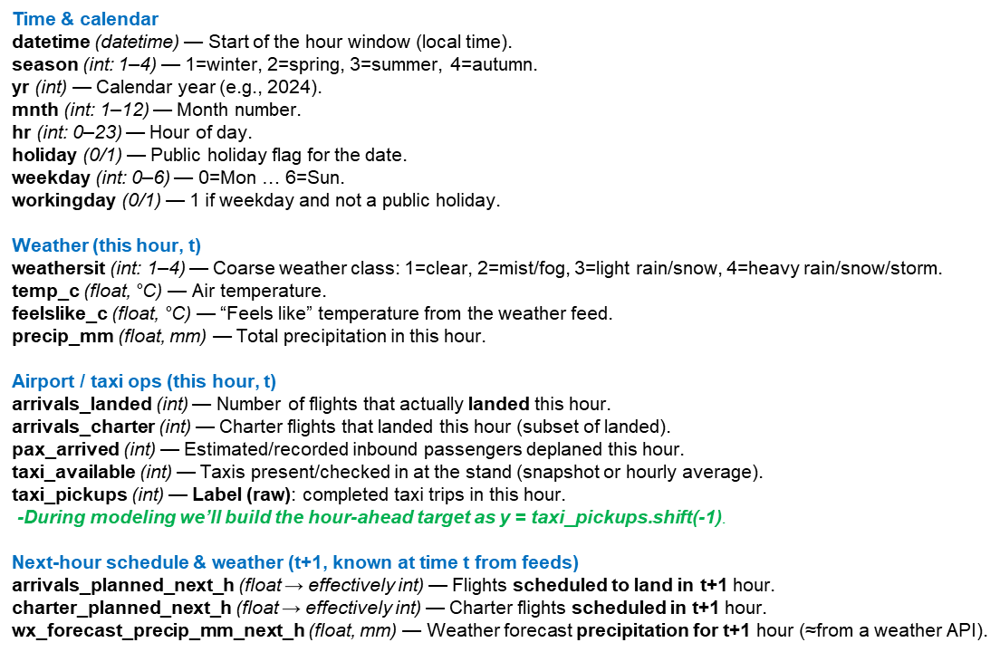
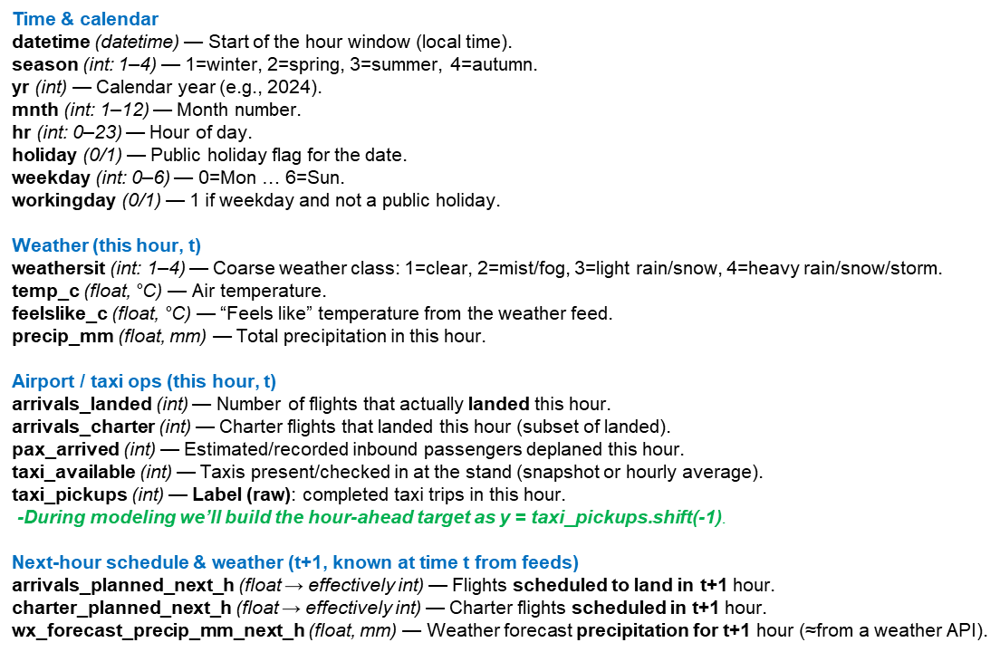
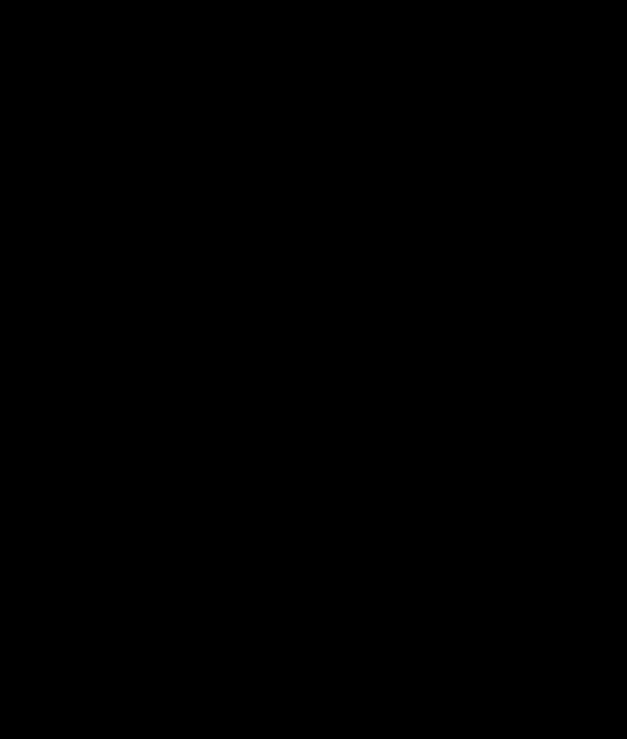

## Data Profiling


In [3]:
df.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
fixed_acidity,4898.0,6.854788,0.843868,3.80000,6.300000,6.80000,7.3000,14.20000
volatile_acidity,4898.0,0.278241,0.100795,0.08000,0.210000,0.26000,0.3200,1.10000
citric_acid,4898.0,0.334192,0.121020,0.00000,0.270000,0.32000,0.3900,1.66000
residual_sugar,4898.0,6.391415,5.072058,0.60000,1.700000,5.20000,9.9000,65.80000
chlorides,4898.0,0.045772,0.021848,0.00900,0.036000,0.04300,0.0500,0.34600
free_sulfur_dioxide,4898.0,35.308085,17.007137,2.00000,23.000000,34.00000,46.0000,289.00000
total_sulfur_dioxide,4898.0,138.360657,42.498065,9.00000,108.000000,134.00000,167.0000,440.00000
density,4898.0,0.994027,0.002991,0.98711,0.991723,0.99374,0.9961,1.03898
pH,4898.0,3.188267,0.151001,2.72000,3.090000,3.18000,3.2800,3.82000
sulphates,4898.0,0.489847,0.114126,0.22000,0.410000,0.47000,0.5500,1.08000


In [4]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:00<00:00, 12038.18it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Profiling Observations — wine quality white

No Missing Values
no null values detected

Categorical Features are Manageable



# Target and Feature Dependency Analysis
## Data Analysis

### Data quality: info, basic stats, missing values
Inspect dtypes, summary statistics, and missing values per column.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         4898 non-null   float64
 1   volatile_acidity      4898 non-null   float64
 2   citric_acid           4898 non-null   float64
 3   residual_sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free_sulfur_dioxide   4898 non-null   float64
 6   total_sulfur_dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [6]:
#missing values
df.isna().sum().sort_values(ascending=False)

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

### Target
Let's visualize the target using Plotly for easy scrolling along the time series

In [10]:
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Add box plot trace for citric acid vs quality
fig.add_trace(go.Box(
    x=df["quality"],
    y=df["citric_acid"],
    name="White-Wine",
    marker=dict(color="crimson")
))

# Update layout
fig.update_layout(
    title="Citric Acid Distribution by Wine Quality (White Wine)",
    xaxis_title="Quality",
    yaxis_title="Citric_Acid",
    width=750,
    height=500
)

fig.show()


### Univariate distributions
Plot histograms for key numeric columns to see their distributions.

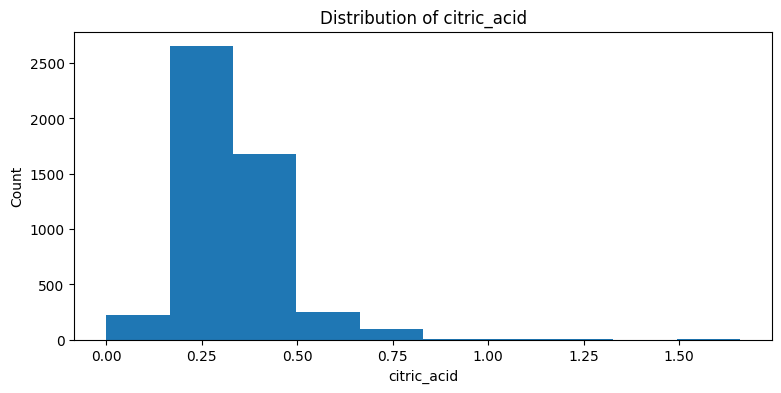

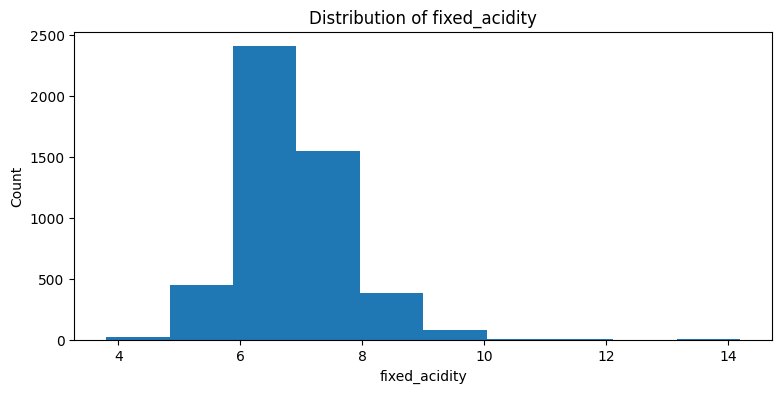

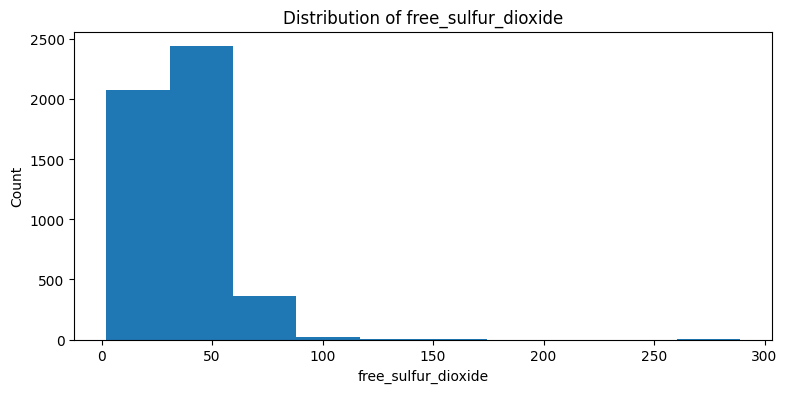

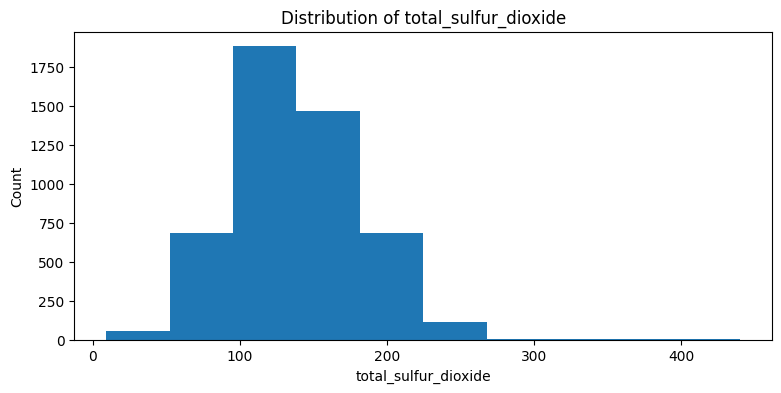

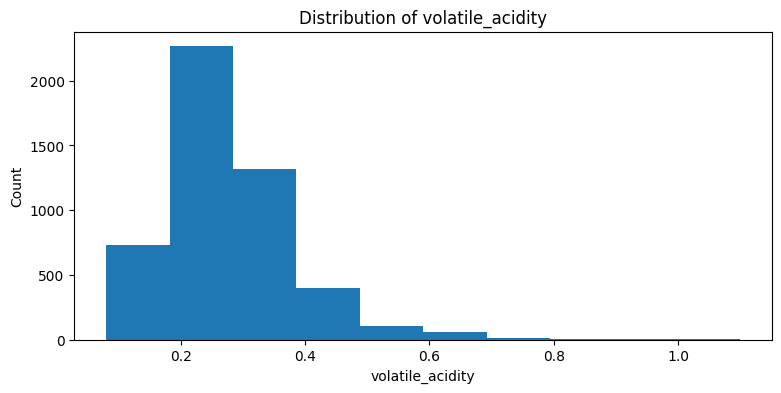

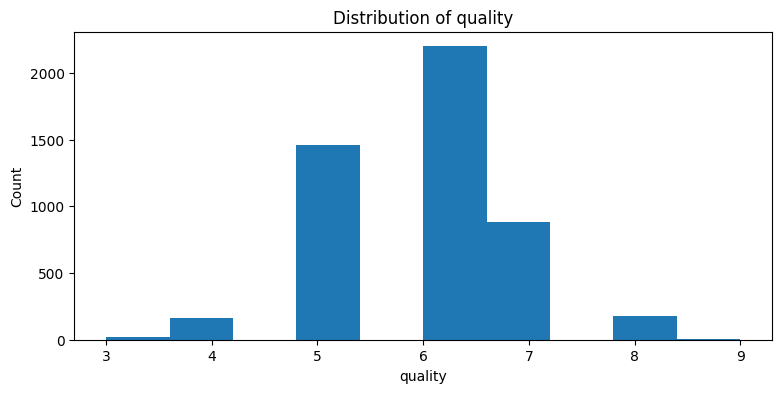

In [8]:
numeric_cols = [
    'citric_acid','fixed_acidity','free_sulfur_dioxide',
    'total_sulfur_dioxide','volatile_acidity', 'quality'
]
for col in numeric_cols:
    plt.figure()
    plt.hist(df[col].dropna(), bins=10)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col); plt.ylabel('Count'); plt.show()

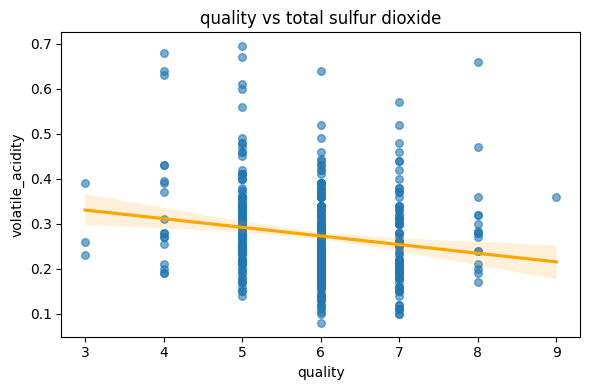

In [11]:
# --- quality vs volatile acidity ---
n = 10  # sample every n-th point for readability
plt.figure(figsize=(6, 4))
sns.regplot(x=df['quality'][::n], y=df['volatile_acidity'][::n],
            scatter_kws={'alpha': 0.6, 's': 30}, line_kws={'color':'orange'})
plt.title("quality vs total sulfur dioxide")
plt.xlabel("quality"); plt.ylabel("volatile_acidity")
plt.tight_layout(); plt.show()


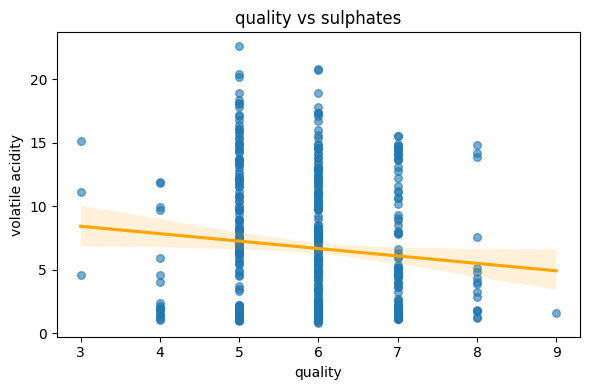

In [12]:
# --- quality vs volatile acidity ---
n = 10  # sample every n-th point for readability
plt.figure(figsize=(6, 4))
sns.regplot(x=df['quality'][::n], y=df['residual_sugar'][::n],
            scatter_kws={'alpha': 0.6, 's': 30}, line_kws={'color':'orange'})
plt.title("quality vs sulphates")
plt.xlabel("quality"); plt.ylabel("volatile acidity")
plt.tight_layout(); plt.show()


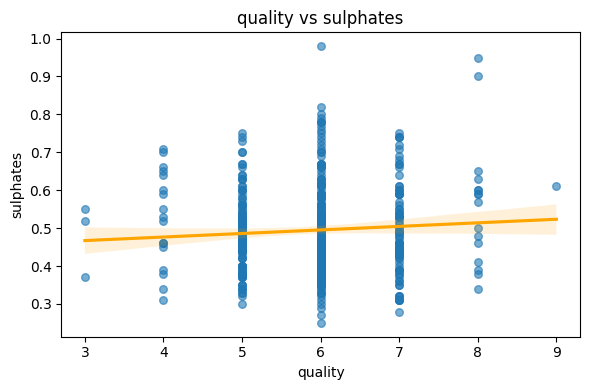

In [13]:
# --- quality vs volatile acidity ---
n = 10  # sample every n-th point for readability
plt.figure(figsize=(6, 4))
sns.regplot(x=df['quality'][::n], y=df['sulphates'][::n],
            scatter_kws={'alpha': 0.6, 's': 30}, line_kws={'color':'orange'})
plt.title("quality vs sulphates")
plt.xlabel("quality"); plt.ylabel("sulphates")
plt.tight_layout(); plt.show()


## Correlation snapshot (raw)
Compute Pearson correlations between numeric columns and `quality`.

In [14]:
num_cols = df.select_dtypes(include=['number']).columns
corr = df[num_cols].corr(numeric_only=True)
corr['quality'].sort_values(ascending=False)

quality                 1.000000
alcohol                 0.435575
pH                      0.099427
sulphates               0.053678
free_sulfur_dioxide     0.008158
citric_acid            -0.009209
residual_sugar         -0.097577
fixed_acidity          -0.113663
total_sulfur_dioxide   -0.174737
volatile_acidity       -0.194723
chlorides              -0.209934
density                -0.307123
Name: quality, dtype: float64

## Outliers (simple z-score)
Flag potential outliers using |z| > 3 on numeric columns (for awareness only).

In [15]:
num = df.select_dtypes(include=['number'])

# z-score
z = (num - num.mean()) / num.std(ddof=0)
outliers = (z.abs() > 3).sum().sort_values(ascending=False)
print(outliers)



chlorides               102
citric_acid              85
volatile_acidity         81
sulphates                48
fixed_acidity            46
free_sulfur_dioxide      32
pH                       32
quality                  25
total_sulfur_dioxide     12
residual_sugar            9
density                   3
alcohol                   0
dtype: int64


## Outliers (IQR)

In [16]:
num = df.select_dtypes(include=['number'])
outlier_counts = {}

for col in num.columns:
    Q1 = num[col].quantile(0.25)
    Q3 = num[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 3 * IQR
    upper = Q3 + 3 * IQR
    outlier_counts[col] = ((num[col] < lower) | (num[col] > upper)).sum()

outliers_iqr = pd.Series(outlier_counts).sort_values(ascending=False)
print(outliers_iqr)
# df["precip_outlier"] = add_outlier_flag(df, "precip_mm")

chlorides               131
volatile_acidity         39
citric_acid              22
sulphates                11
free_sulfur_dioxide       8
fixed_acidity             4
density                   3
total_sulfur_dioxide      2
residual_sugar            1
pH                        0
alcohol                   0
quality                   0
dtype: int64
